In [213]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

In [214]:
df = pd.read_excel("data/LRF-WRP-Data-DCAwards.xlsx", skiprows=[0])
print(df.info())
print(df.columns)
print(df.head())
df.drop([0], inplace=True)
df.dtypes

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 515 entries, 0 to 514
Columns: 287 entries, Unnamed: 0 to Global
dtypes: object(287)
memory usage: 1.1+ MB
None
Index(['Unnamed: 0', 'Unnamed: 1', 'Afghanistan', 'Unnamed: 3', 'Albania',
       'Unnamed: 5', 'Algeria', 'Unnamed: 7', 'Argentina', 'Unnamed: 9',
       ...
       'Unnamed: 277', 'Vietnam', 'Unnamed: 279', 'Yemen', 'Unnamed: 281',
       'Zambia', 'Unnamed: 283', 'Zimbabwe', 'Unnamed: 285', 'Global'],
      dtype='object', length=287)
                                          Unnamed: 0   Unnamed: 1 Afghanistan  \
0                                                NaN          NaN  Column N %   
1  L1 When you hear the word RISK, do you think m...  Opportunity    0.105026   
2                                                NaN       Danger    0.829202   
3                                                NaN       (Both)    0.059066   
4                                                NaN    (Neither)    0.005445   

         Un

Unnamed: 0      object
Unnamed: 1      object
Afghanistan     object
Unnamed: 3      object
Albania         object
                 ...  
Zambia          object
Unnamed: 283    object
Zimbabwe        object
Unnamed: 285    object
Global          object
Length: 287, dtype: object

In [215]:
df.iloc[:,2] = df.iloc[:,2].astype(float)
df.iloc[:,3:] = df.iloc[:,3:].astype(float)
df.iloc[:,2::2] = df.iloc[:,2::2].apply(lambda x: round(x * 100, 2), axis=1)
print(df.dtypes)
df.rename(columns={'Unnamed: 1': "Responses"}, inplace=True)
df.head()

Unnamed: 0       object
Unnamed: 1       object
Afghanistan     float64
Unnamed: 3      float64
Albania         float64
                 ...   
Zambia          float64
Unnamed: 283    float64
Zimbabwe        float64
Unnamed: 285    float64
Global          float64
Length: 287, dtype: object


,Unnamed: 0,Responses,Afghanistan,Unnamed: 3,Albania,Unnamed: 5,Algeria,Unnamed: 7,Argentina,Unnamed: 9,...,Unnamed: 277,Vietnam,Unnamed: 279,Yemen,Unnamed: 281,Zambia,Unnamed: 283,Zimbabwe,Unnamed: 285,Global
1,"L1 When you hear the word RISK, do you think m...",Opportunity,10.50,118.0,45.61,473.0,10.26,120.0,11.61,121.0,...,132.0,10.00,99.0,8.61,95.0,11.55,108.0,15.87,170.0,21.27
2,NaN,Danger,82.92,932.0,37.58,415.0,61.48,658.0,83.99,888.0,...,924.0,77.26,784.0,64.21,758.0,76.47,767.0,77.40,845.0,59.59
3,NaN,(Both),5.91,71.0,11.97,125.0,21.17,255.0,2.51,33.0,...,13.0,4.24,39.0,10.42,132.0,3.77,47.0,2.78,29.0,7.58
4,NaN,(Neither),0.54,4.0,0.77,8.0,2.94,31.0,0.72,7.0,...,3.0,0.58,8.0,4.22,54.0,1.48,15.0,1.73,20.0,3.54
5,NaN,(DK),0.13,2.0,4.07,59.0,4.13,35.0,0.94,9.0,...,7.0,7.88,71.0,12.43,100.0,6.72,63.0,1.93,16.0,7.65


In [216]:
df['Total'] = df.iloc[:,1::2].sum(axis=1)
df[['Total']]

/var/folders/6d/t1t1r89n1q95d2ztv2qstyb40000gr/T/ipykernel_11009/3627032994.py:1: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  df['Total'] = df.iloc[:,1::2].sum(axis=1)
/var/folders/6d/t1t1r89n1q95d2ztv2qstyb40000gr/T/ipykernel_11009/3627032994.py:1: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  df['Total'] = df.iloc[:,1::2].sum(axis=1)


,Total
1,31456.0
2,100661.0
3,12139.0
4,2715.0
5,6963.0
...,...
510,41593.0
511,46641.0
512,1226.0
513,153.0


In [217]:
Q2SLICE = { "L1": (0, 7, 7 ), "L2": (0,0), "L3A":(13, 34, 22),  "L3B":(35, 57, 22)}

In [218]:
def getDFForQuestion(start, stop):
    df_ = df.iloc[start:stop, 1:]
    df_.set_index('Responses', inplace=True)

    df_ab, df_pc = df_.iloc[:,1::2], df_.iloc[:,0::2]
    total_responses = df_ab.loc['Total', 'Total']
    print("total_responses", total_responses)
    
    df_ab['Total%'] = round(100 * df_ab['Total']/ total_responses,2)
    print(df_ab[['Total', 'Total%']]) # 31456

    df_pc_t = df_pc.transpose()
    
    print(df_ab.iloc[:5,:5])
    print(df_pc.iloc[:5,:5])
    print(df_pc_t.iloc[:5,:5])
    return df_ab, df_pc, df_pc_t

## L1 When you hear the word RISK, do you think more about opportunity or danger?

In [219]:
df_l1_ab, df_l1_pc, df_pc_t = getDFForQuestion(0, 7)

total_responses 154195.0
                Total  Total%
Responses                    
Opportunity   31456.0   20.40
Danger       100661.0   65.28
(Both)        12139.0    7.87
(Neither)      2715.0    1.76
(DK)           6963.0    4.52
(Refused)       261.0    0.17
Total        154195.0  100.00
             Unnamed: 3  Unnamed: 5  Unnamed: 7  Unnamed: 9  Unnamed: 11
Responses                                                               
Opportunity       118.0       473.0       120.0       121.0        469.0
Danger            932.0       415.0       658.0       888.0        336.0
(Both)             71.0       125.0       255.0        33.0        130.0
(Neither)           4.0         8.0        31.0         7.0         55.0
(DK)                2.0        59.0        35.0         9.0         86.0
             Afghanistan  Albania  Algeria  Argentina  Armenia
Responses                                                     
Opportunity        10.50    45.61    10.26      11.61    45.36
Dange

/var/folders/6d/t1t1r89n1q95d2ztv2qstyb40000gr/T/ipykernel_11009/3564368344.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_ab['Total%'] = round(100 * df_ab['Total']/ total_responses,2)


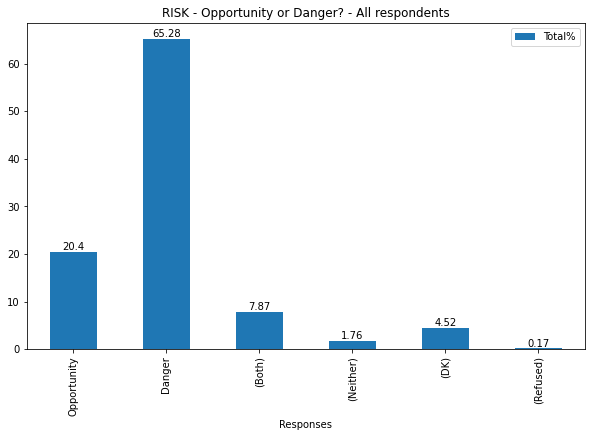

In [220]:
ax = df_l1_ab.iloc[:-1,:][['Total%']].plot.bar(title="RISK - Opportunity or Danger? - All respondents", figsize=(10, 6))
for container in ax.containers:
    ax.bar_label(container)

In [221]:
df_l1_pc_t.describe()

Responses,Opportunity,Danger,(Both),(Neither),(DK),(Refused),Total,More safe
count,143.000000,143.000000,143.000000,143.00000,143.000000,143.000000,143.0,143.000000
mean,20.839021,65.592517,7.589301,1.54951,4.277273,0.153566,100.0,25.088322
std,11.472379,15.278259,7.680447,2.22076,4.226753,0.255956,0.0,13.141961
min,4.000000,17.000000,0.210000,0.00000,0.110000,0.000000,100.0,2.330000
25%,12.190000,57.515000,2.205000,0.43000,1.175000,0.000000,100.0,15.565000
50%,17.860000,69.250000,4.240000,0.84000,3.110000,0.050000,100.0,23.520000
75%,26.295000,77.185000,9.775000,1.93000,6.350000,0.195000,100.0,32.985000
max,72.870000,89.200000,40.690000,20.28000,30.680000,1.350000,100.0,67.300000


<AxesSubplot:>

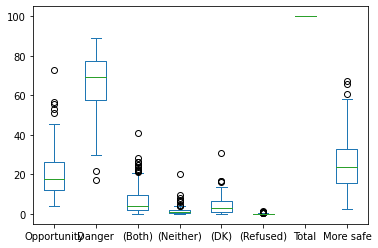

In [222]:
df_l1_pc_t.plot.box()

<AxesSubplot:xlabel='Responses'>

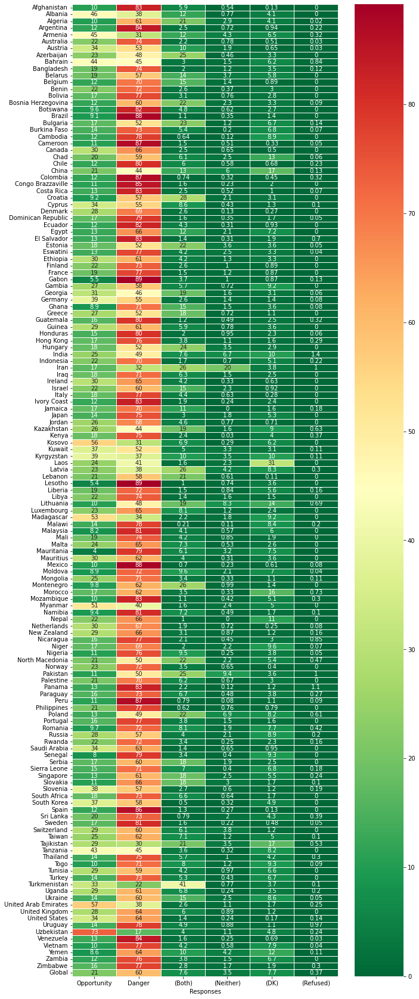

In [223]:
plt.figure(figsize=(10,30))
sns.heatmap(df_l1_pc_t.iloc[:,:6], cmap='RdYlGn_r', linewidths=0.5, annot=True)

<AxesSubplot:xlabel='Responses'>

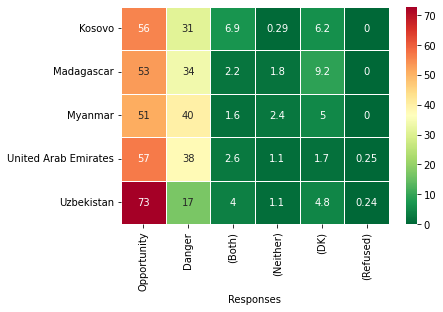

In [224]:
sns.heatmap(df_l1_pc_t.iloc[:,:6][df_l1_pc_t['Opportunity']>50], cmap='RdYlGn_r', linewidths=0.5, annot=True)

<AxesSubplot:xlabel='Responses'>

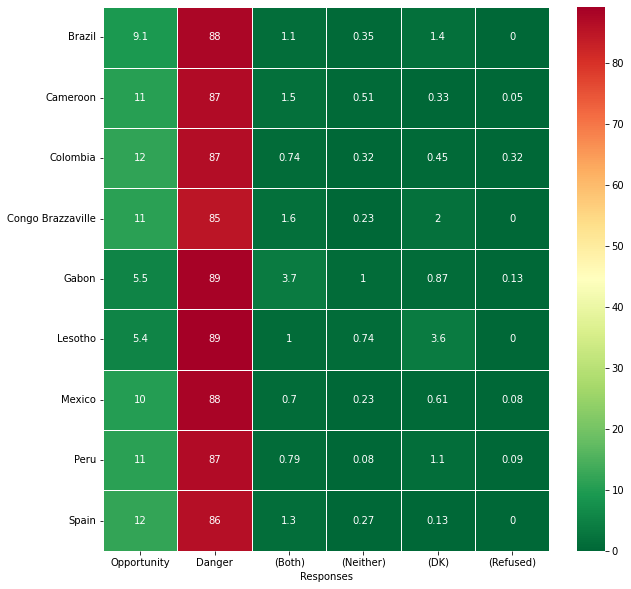

In [225]:
plt.figure(figsize=(10,10))
sns.heatmap(df_l1_pc_t.iloc[:,:6][df_l1_pc_t['Danger']>85], cmap='RdYlGn_r', linewidths=0.5, annot=True)

<AxesSubplot:xlabel='Responses'>

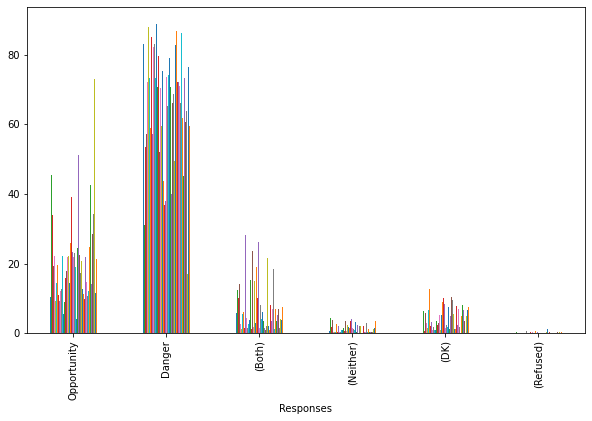

In [226]:
df_l1_pc.iloc[:-1,::2].plot.bar(figsize=(10, 6),legend=False)

## L2 Overall, compared to five years ago, do you feel more safe, less safe, or about as safe as you did five years ago?

## L3_A In your own words, what is the greatest source of RISK TO YOUR SAFETY in your daily life?

In [227]:
df_l3_ab, df_l3_pc, df_l3_pc_t = getDFForQuestion(13, 35)

total_responses 154195.0
                                                       Total  Total%
Responses                                                           
Road-related accidents/injuries (such as using ...   23635.0   15.33
Other transportation-related accidents/injuries...    2473.0    1.60
Crime/violence/terrorism                             28388.0   18.41
Cooking or other household accidents/injuries         3704.0    2.40
Financial: not having enough money to pay for t...    9839.0    6.38
Economy-related, such as unemployment, high prices    7965.0    5.17
Politics/political situation/corruption               3162.0    2.05
Internet/technology related risks                      753.0    0.49
Health: personal health condition/illness            19566.0   12.69
Health: drugs, alcohol, smoking                       1583.0    1.03
Water supply or drinking unclean water                 625.0    0.41
Food-related: eating unsafe contaminated food         1409.0    0.91
Pollution

/var/folders/6d/t1t1r89n1q95d2ztv2qstyb40000gr/T/ipykernel_11009/3564368344.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_ab['Total%'] = round(100 * df_ab['Total']/ total_responses,2)


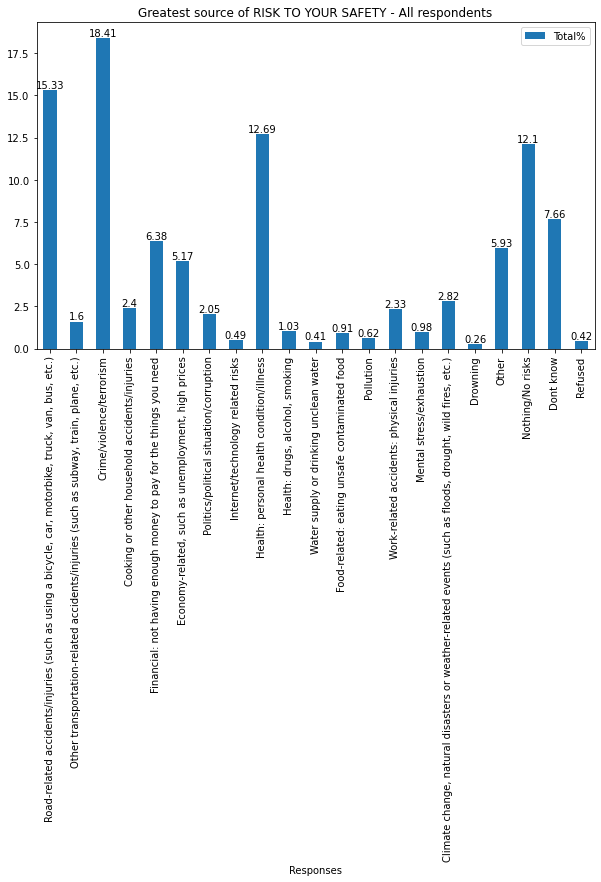

In [228]:
ax = df_l3_ab.iloc[:-1,:][['Total%']].plot.bar(title="Greatest source of RISK TO YOUR SAFETY - All respondents", figsize=(10, 6))
for container in ax.containers:
    ax.bar_label(container)

<AxesSubplot:xlabel='Responses'>

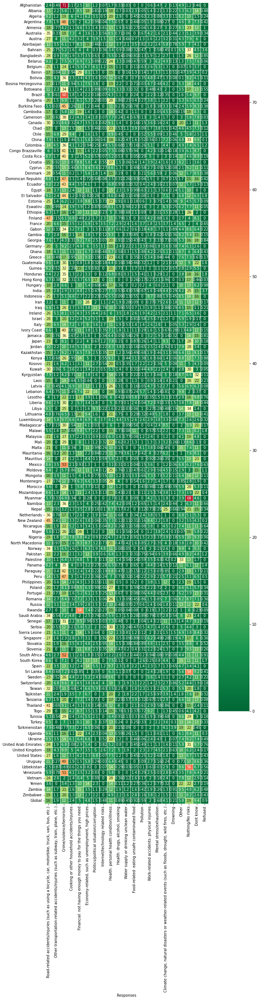

In [252]:
plt.figure(figsize=(10,40))
sns.heatmap(df_l3_pc_t.iloc[:,:21], cmap='RdYlGn_r', linewidths=0.5, annot=True)

<AxesSubplot:xlabel='Responses'>

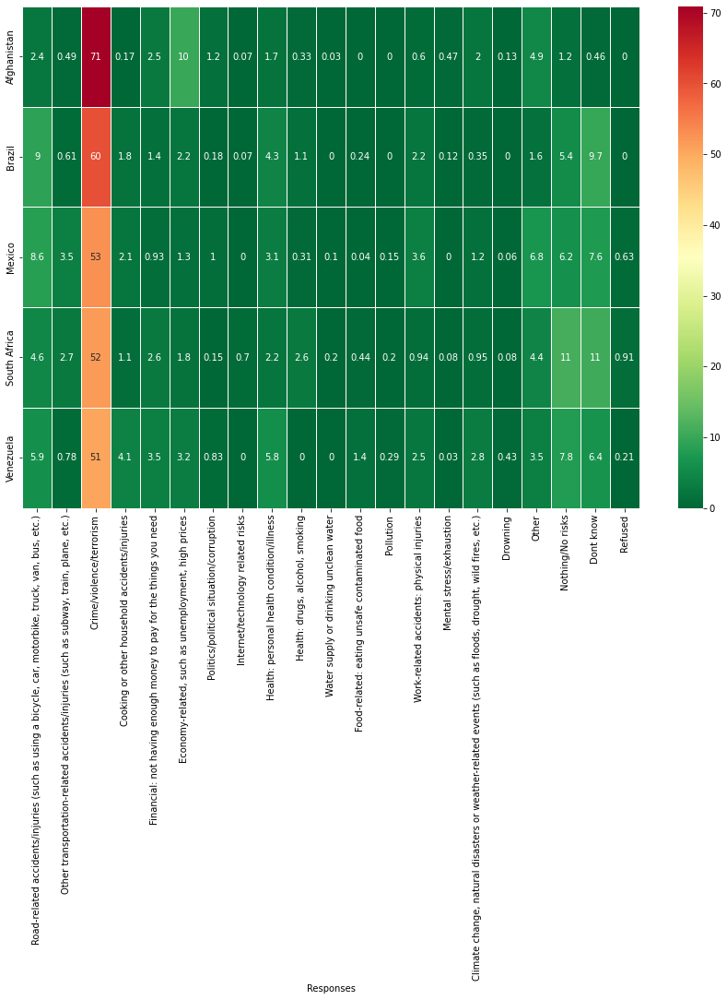

In [238]:
plt.figure(figsize=(15,10))
sns.heatmap(df_l3_pc_t.iloc[:,:21][df_l3_pc_t['Crime/violence/terrorism']>50], cmap='RdYlGn_r', linewidths=0.5, annot=True)

<AxesSubplot:xlabel='Responses'>

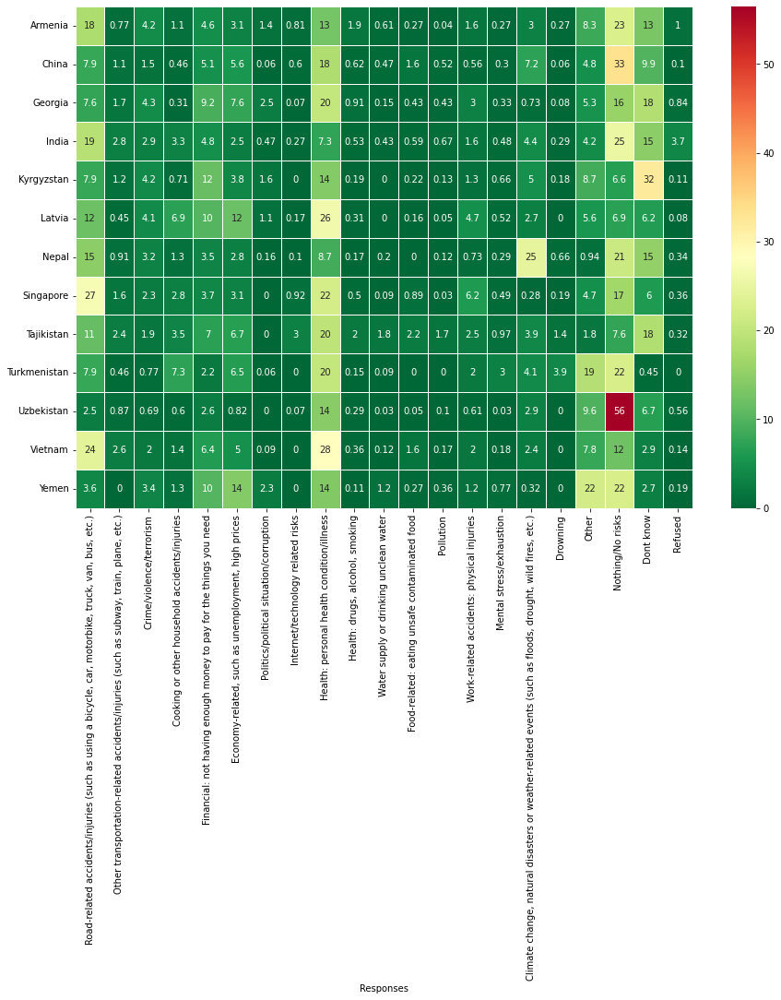

In [239]:
plt.figure(figsize=(15,10))
sns.heatmap(df_l3_pc_t.iloc[:,:21][df_l3_pc_t['Crime/violence/terrorism'] <= 5], cmap='RdYlGn_r', linewidths=0.5, annot=True)

<AxesSubplot:xlabel='Responses'>

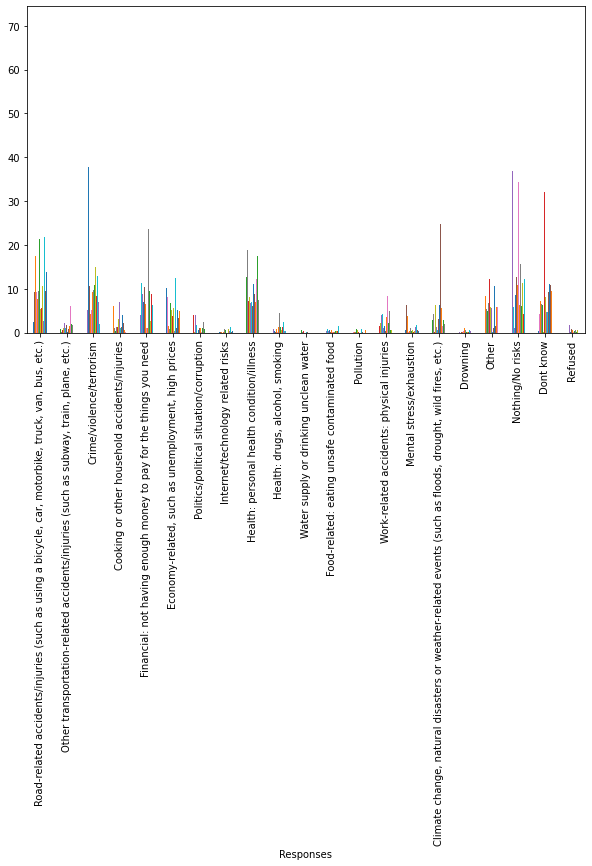

In [232]:
df_l3_pc.iloc[:-1,::2].plot.bar(figsize=(10, 6),legend=False)

In [241]:
df_l3_pc_t['Road-related accidents/injuries (such as using a bicycle, car, motorbike, truck, van, bus, etc.)']

Afghanistan     2.44
Albania        13.15
Algeria         9.15
Argentina       7.79
Armenia        17.82
               ...  
Vietnam        24.23
Yemen           3.65
Zambia         13.85
Zimbabwe       19.11
Global         15.62
Name: Road-related accidents/injuries (such as using a bicycle, car, motorbike, truck, van, bus, etc.), Length: 143, dtype: float64

In [242]:
df_l3_pc_t['Road-related accidents/injuries (such as using a bicycle, car, motorbike, truck, van, bus, etc.)'].describe()

count    143.000000
mean      15.666364
std        8.983243
min        1.700000
25%        8.635000
50%       14.680000
75%       20.665000
max       46.800000
Name: Road-related accidents/injuries (such as using a bicycle, car, motorbike, truck, van, bus, etc.), dtype: float64

<AxesSubplot:xlabel='Responses'>

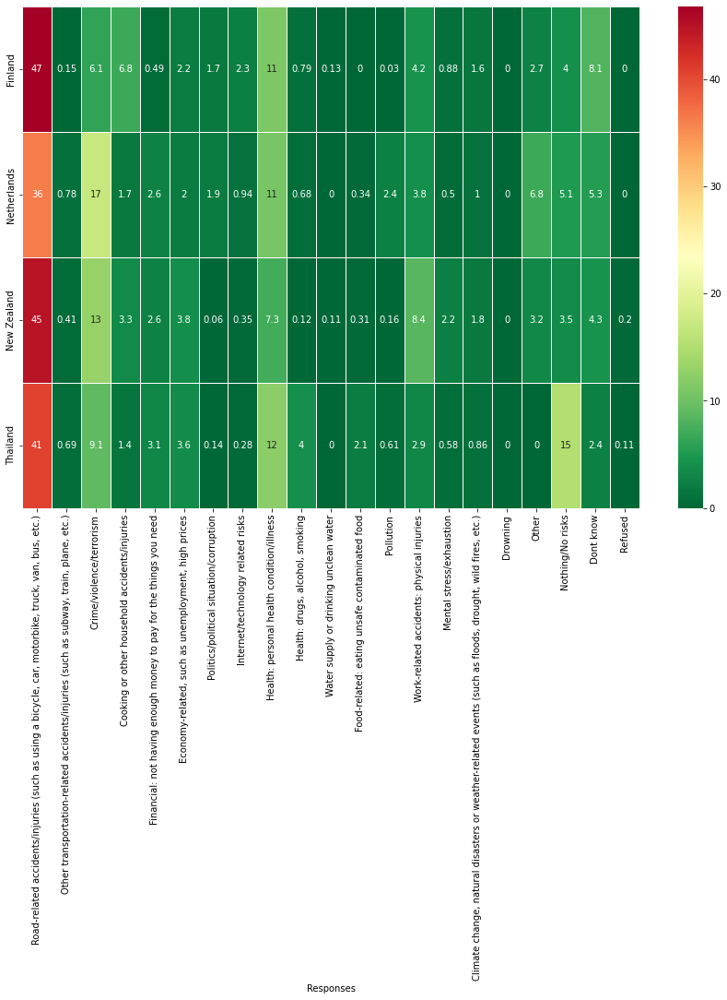

In [246]:
plt.figure(figsize=(15,10))
sns.heatmap(df_l3_pc_t.iloc[:,:21][df_l3_pc_t['Road-related accidents/injuries (such as using a bicycle, car, motorbike, truck, van, bus, etc.)']>35], cmap='RdYlGn_r', linewidths=0.5, annot=True)

<AxesSubplot:xlabel='Responses'>

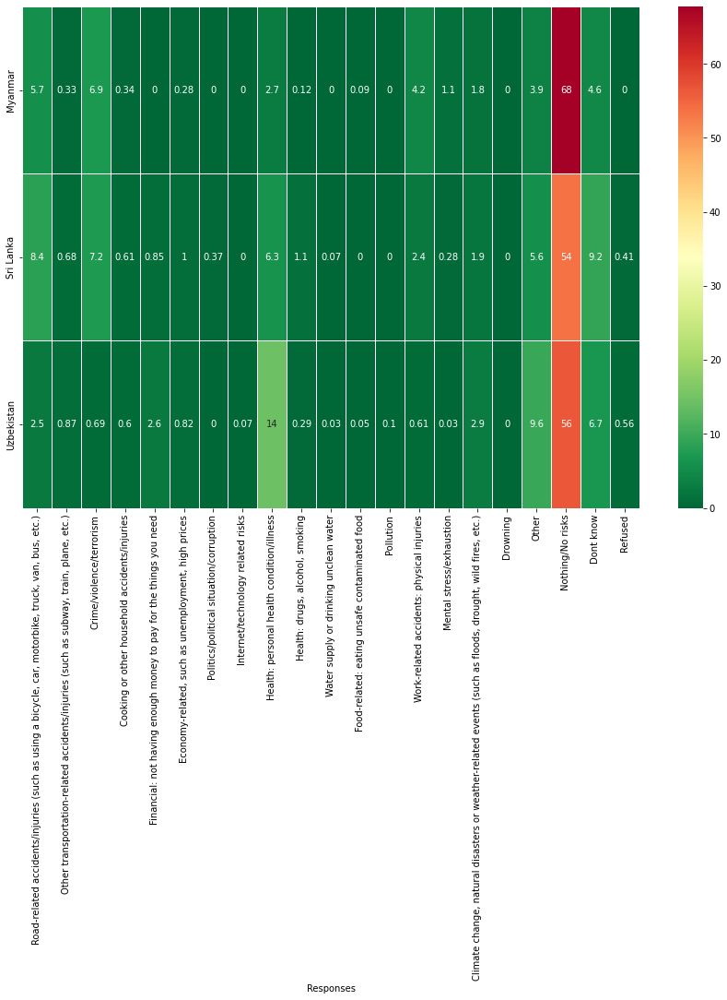

In [256]:
plt.figure(figsize=(15,10))
sns.heatmap(df_l3_pc_t.iloc[:,:21][df_l3_pc_t['Nothing/No risks']>50], cmap='RdYlGn_r', linewidths=0.5, annot=True)

total_responses 123333.0
                                                       Total  Total%
Responses                                                           
Road-related accidents/injuries (such as using ...   12994.0   10.54
Other transportation-related accidents/injuries...    1934.0    1.57
Crime/violence/terrorism                             16617.0   13.47
Cooking or other household accidents/injuries         3016.0    2.45
Financial: not having enough money to pay for t...    7223.0    5.86
Economy-related, such as unemployment, high prices    6341.0    5.14
Politics/political situation/corruption               2909.0    2.36
Internet/technology related risks                      693.0    0.56
Health: personal health condition/illness            13920.0   11.29
Health: drugs, alcohol, smoking                       1675.0    1.36
Water supply or drinking unclean water                 831.0    0.67
Food-related: eating unsafe contaminated food         1599.0    1.30
Pollution

/var/folders/6d/t1t1r89n1q95d2ztv2qstyb40000gr/T/ipykernel_11009/3564368344.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_ab['Total%'] = round(100 * df_ab['Total']/ total_responses,2)


<AxesSubplot:xlabel='Responses'>

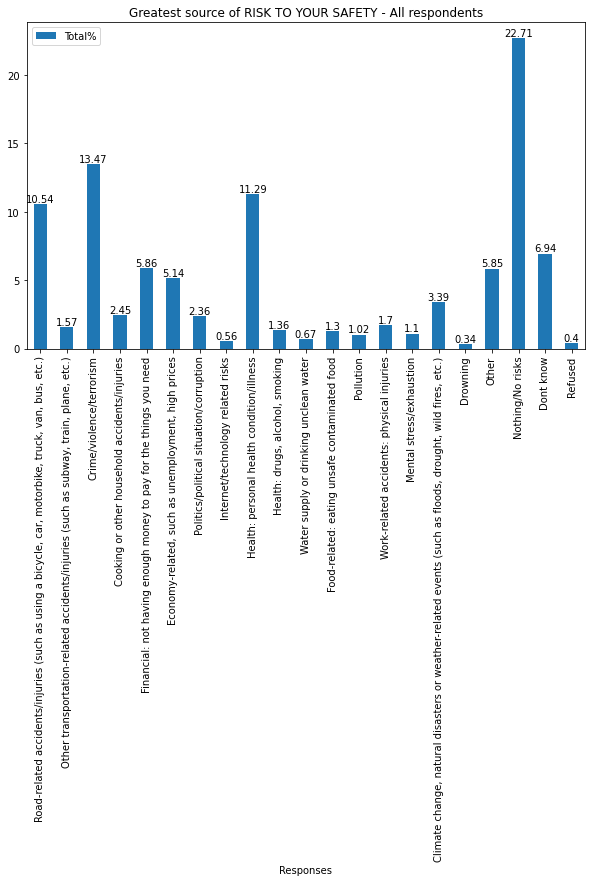

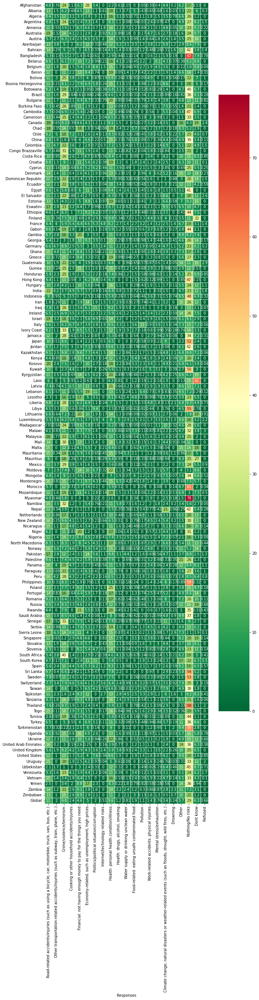

In [260]:
df_l3b_ab, df_l3b_pc, df_l3b_pc_t = getDFForQuestion(35, 57) # 21
ax = df_l3b_ab.iloc[:-1,:][['Total%']].plot.bar(title="Greatest source of RISK TO YOUR SAFETY - All respondents", figsize=(10, 6))
for container in ax.containers:
    ax.bar_label(container)
plt.figure(figsize=(10,40))
sns.heatmap(df_l3b_pc_t.iloc[:,:21], cmap='RdYlGn_r', linewidths=0.5, annot=True)


<AxesSubplot:xlabel='Responses'>

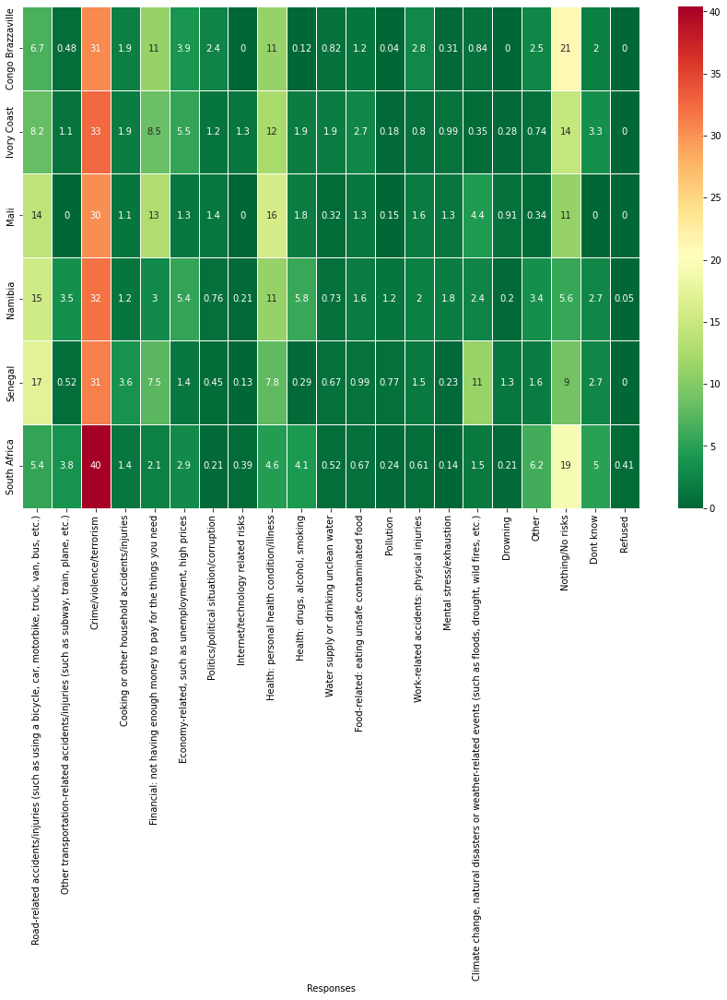

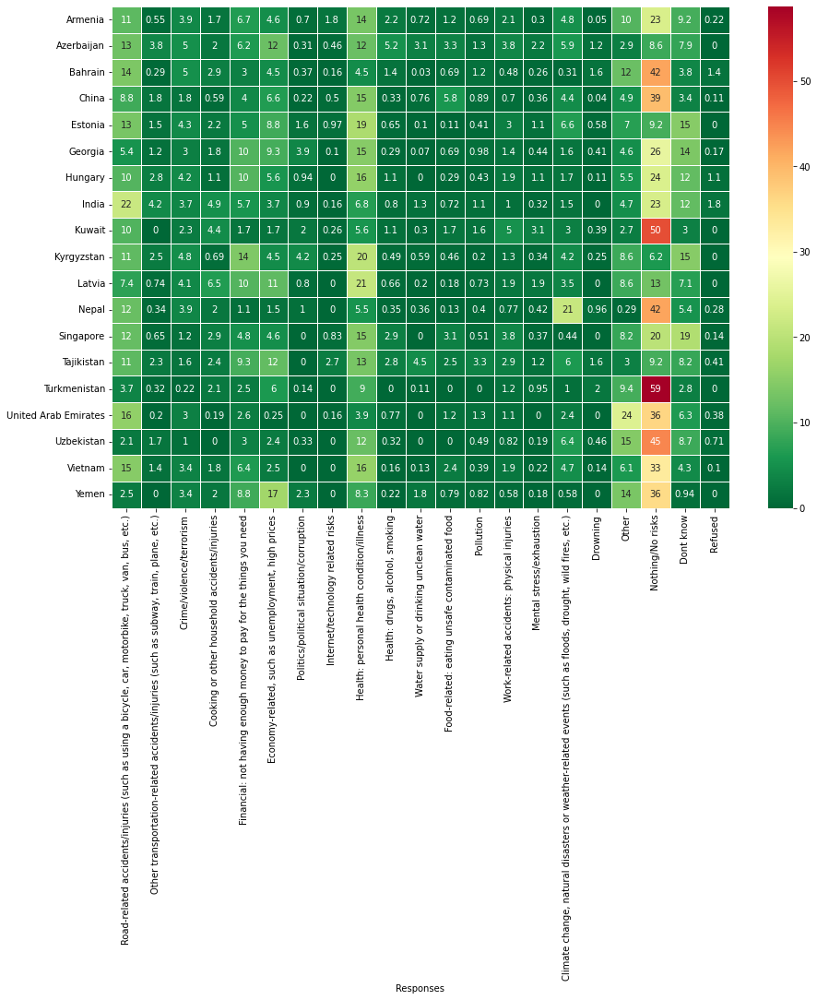

In [262]:
plt.figure(figsize=(15,10))
sns.heatmap(df_l3b_pc_t.iloc[:,:21][df_l3b_pc_t['Crime/violence/terrorism']>30], cmap='RdYlGn_r', linewidths=0.5, annot=True)
plt.figure(figsize=(15,10))
sns.heatmap(df_l3b_pc_t.iloc[:,:21][df_l3b_pc_t['Crime/violence/terrorism'] <= 5], cmap='RdYlGn_r', linewidths=0.5, annot=True)

<AxesSubplot:xlabel='Responses'>

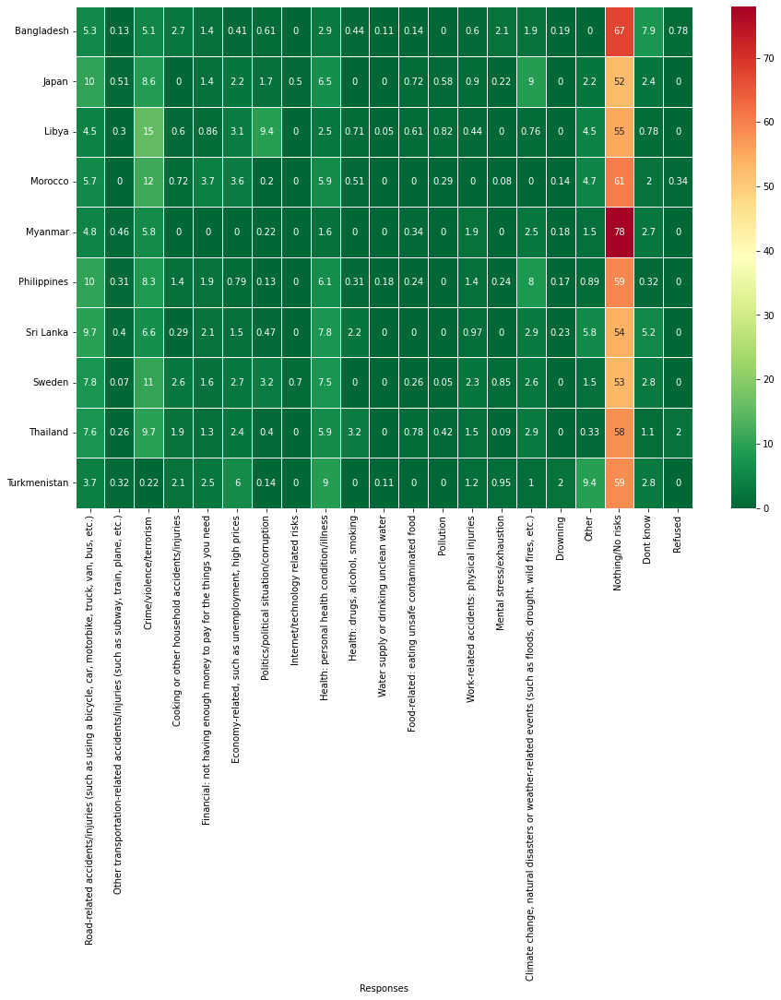

In [264]:
plt.figure(figsize=(15,10))
sns.heatmap(df_l3b_pc_t.iloc[:,:21][df_l3b_pc_t['Nothing/No risks'] > 50], cmap='RdYlGn_r', linewidths=0.5, annot=True)

L3_B Other than what you just mentioned in your own words what is another MAJOR source of RISK TO YOUR SAFETY in your daily life - 35, 46, 21

L6E In general, how WORRIED are you that each of the following things could cause you serious harm? Are you very worried, somewhat worried, or not worried? Violent crime



How are the risks and how a risk is perceived related?